In [14]:
using DifferentialEquations
using Plots, LaTeXStrings
using Markdown
using Printf

In [15]:
# Equations

"""Single pendulum with friction"""
spwf = (θ, ω, g, L, μ) -> -μ * ω - g / L * sin(θ)

"""Double pednulum (withou friction)"""
function dp(θ₁, θ₂, ω₁, ω₂, m₁, m₂, g, L₁, L₂)
    dω₁ = (
        -g*m₂*(sin(2*θ₂-θ₁)-sin(θ₁)) - L₁*m₂*ω₁^2*sin(2*θ₂-2*θ₁) 
        - 2*L₂*m₂*ω₂^2*sin(θ₂-θ₁) + 2*g*m₁*sin(θ₁)
        ) / (L₁*m₂*(cos(2*(θ₂-θ₁))-1) - 2*L₁*m₁)
    dω₂ = (
        L₂*m₂*ω₂^2*sin(2*θ₂-2*θ₁) + 2*L₁*m₂*ω₁^2*sin(θ₂-θ₁) + 2*L₁*m₁*ω₁^2*sin(θ₂-θ₁) +
        g*m₂*(sin(θ₂-2*θ₁)+sin(θ₂)) + g*m₁*(sin(θ₂-2*θ₁)+sin(θ₂))
        ) / (L₂*m₂*(cos(2*(θ₂-θ₁))-1) - 2*L₂*m₁)
    return (dω₁, dω₂)
end

"""Double pednulum with friction"""
function dpwf(θ₁, θ₂, ω₁, ω₂, m₁, m₂, g, L₁, L₂, μ₁, μ₂)
    dω₁ = (
        L₁*ω₁*(cos(2*(θ₂-θ₁))-1)*μ₂ - 2*L₁*ω₁*μ₁ + g*m₂*(sin(2*θ₂-θ₁)-sin(θ₁)) + 
        L₁*m₂*ω₁^2*sin(2*θ₂-2*θ₁) + 2*L₂*m₂*ω₂^2*sin(θ₂-θ₁) - 2*g*m₁*sin(θ₁)
        ) / (2*L₁*m₁ - L₁*m₂*(cos(2*(θ₂-θ₁))-1))
    dω₂ = (
        L₂*m₂*ω₂*(cos(2*(θ₂-θ₁))-1)*μ₂ - 2*L₁*m₁*ω₁*cos(θ₂-θ₁)*μ₂ - 2*L₂*m₁*ω₂*μ₂ + 
        2*L₁*m₂*ω₁*cos(θ₂-θ₁)*μ₁ - L₂*m₂^2*ω₂^2*sin(2*θ₂-2*θ₁) - 2*L₁*m₂^2*ω₁^2*sin(θ₂-θ₁) - 
        2*L₁*m₁*m₂*ω₁^2*sin(θ₂-θ₁) - g*m₂^2*(sin(θ₂-2*θ₁)+sin(θ₂)) - g*m₁*m₂*(sin(θ₂-2*θ₁)+sin(θ₂))
        ) / (2*L₂*m₁*m₂ - L₂*m₂^2*(cos(2*(θ₂-θ₁))-1))
    return (dω₁, dω₂)
end

dpwf

In [16]:
# Parameters
g = 9.8

θ₁_, θ₂_ = [0 0]
ω₁_, ω₂_ = [4 0]
m₁, m₂ = [1 4]
L₁, L₂ = [5 10]
μ₁, μ₂ = 0.1 .* [m₁ m₂]

u₀ = [θ₁_, ω₁_]
u₀_double = [θ₁_, θ₂_, ω₁_, ω₂_]

params = [g, L₁, μ₁]
params_double = [m₁, m₂, g, L₁, L₂]
params_double_wf = [m₁, m₂, g, L₁, L₂, μ₁, μ₂]

tspan = (0.0, 100.0)

(0.0, 100.0)

In [17]:
# Helper functions
x = (L, θ) -> L * sin(θ)
y = (L, θ) -> - L * cos(θ)

function vec_to_list(vecvec, dim) 
    vecvec[dim]
end

vec_to_list (generic function with 1 method)

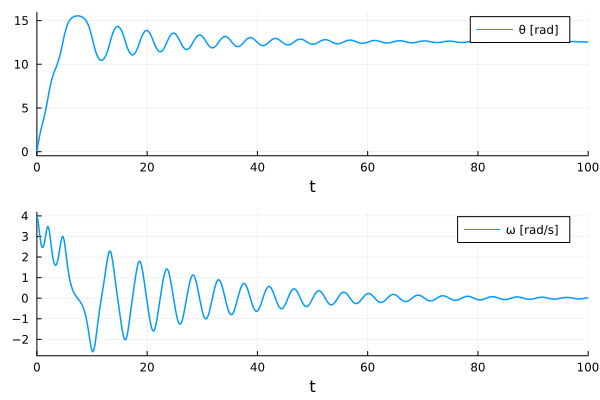

In [18]:
function pendulum_problem!(du, u, params, t)
    g, L, μ = params
    θ, ω = u
    du[1] = ω
    du[2] = spwf(u..., params...)
end

prob = ODEProblem(pendulum_problem!, u₀, tspan, params)
sol_single_wf = solve(prob, reltol=1e-5, saveat=10e-3)

plot(sol_single_wf, linewidth=1.5, layout=(2,1), label=["θ [rad]" "ω [rad/s]"], xaxis="t")

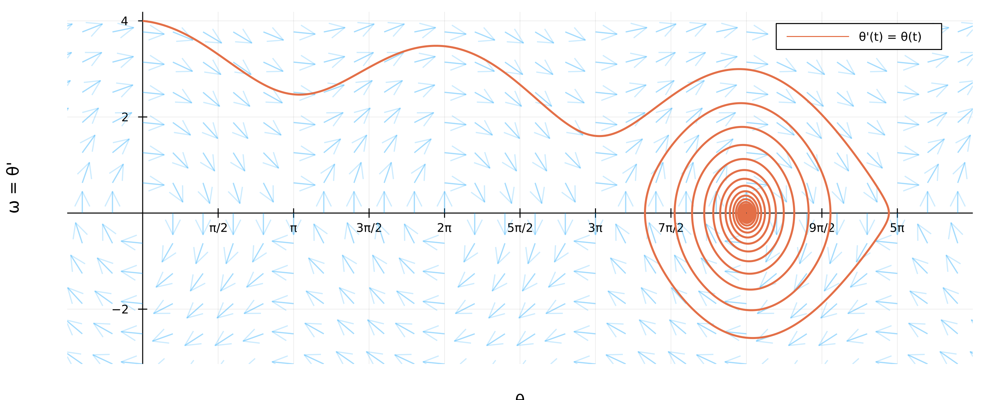

In [19]:

θ_bounds = 6*pi
ω_bounds = 2*pi
step = [ pi/5, pi/5]
kh = 0.45
mesh = [[i, j] for i=-θ_bounds:step[1]:θ_bounds for j=-ω_bounds:step[2]:ω_bounds]
slopes = [spwf(point..., params...) for point in mesh]
θf, ωf = @. (vec_to_list(mesh, 1), vec_to_list(mesh, 2))
lens = @. 1 / sqrt(ωf ^ 2 + slopes ^ 2) * kh

θ, ω = @. (vec_to_list(sol_single_wf.u, 1), vec_to_list(sol_single_wf.u, 2));

xticks_str = ["0", "π/2", "π", "3π/2", "2π", "5π/2", "3π", "7π/2", "", "9π/2", "5π"]

fieldp = quiver(θf, ωf, quiver=(lens .* ωf, lens .* slopes), line=(1.2, 0.2))
plot!(fieldp, θ, ω, line=(2), label="θ'(t) = θ(t)", legend=:topright)
plot!(fieldp, framestyle=:origin, xticks = (collect(0:pi/2:5*pi), xticks_str), aspect_ratio=1, dpi=300)
plot!(fieldp,  xaxis=("θ", (-1*pi/2,11*pi/2)), yaxis=("ω = θ'", (-3*pi/3,4*pi/3)), size=(1000, 400))


┌ Info: Saved animation to 
│   fn = c:\Users\vital\git_projects\double-pendulum\animations\single_pendulum_with_friction.gif
└ @ Plots C:\Users\vital\.julia\packages\Plots\9C6z9\src\animation.jl:114


Plots.AnimatedGif("c:\\Users\\vital\\git_projects\\double-pendulum\\animations\\single_pendulum_with_friction.gif")
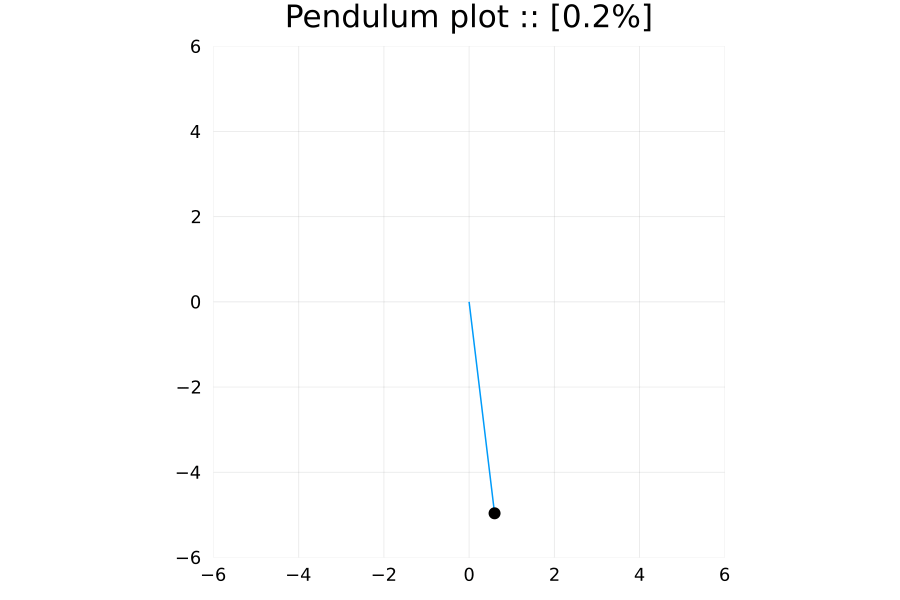

In [20]:
@userplot pendulumanim
@recipe function fpend!(oa::pendulumanim)
    x, y, m, title_time = oa.args
    title --> "Pendulum plot :: [$(@sprintf("%2.1f", title_time))%]"
    xlims --> (-L₁-1, L₁+1)
    ylims --> (-L₁-1, L₁+1)
    markersize --> 5 * m
    markercolor --> "black"
    seriestype --> :scatter
    legend --> :none
    framestyle --> :grid
    aspect_ratio --> 1
    dpi --> 150
    [x], [y]
end

function pendulum_example()

    # time frame
    t = 0:0.02:50
    k = 4
    n = length(t) / k |> floor |> Int

    # animation
    anim = @animate for i in 1:n
        x_ball = x(L₁, θ[k*i])
        y_ball = y(L₁, θ[k*i])
        spend = plot([0, x_ball], [0, y_ball])
        pendulumanim!(spend, x_ball, y_ball, m₁, i/n * 100)
    end

    gif(anim, "animations/single_pendulum_with_friction.gif", fps=50)
end
pendulum_example()

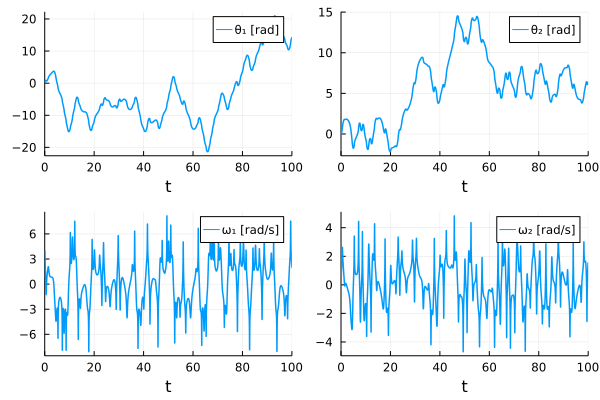

In [21]:
function double_pendulum_problem!(du, u, params, t)
    m₁, m₂, g, L₁, L₂ = params 
    θ₁, θ₂, ω₁, ω₂ = u
    du[1] = ω₁  # du[3]
    du[2] = ω₂  # du[4]
    du[3], du[4] = dp(u..., params...)
end

prob_double = ODEProblem(double_pendulum_problem!, u₀_double, tspan, params_double)
sol_double = solve(prob_double, reltol=1e-5, saveat=10e-3)

plot(sol_double, linewidth=1.5, layout=(2,2), label=["θ₁ [rad]" "θ₂ [rad]" "ω₁ [rad/s]" "ω₂ [rad/s]"], xaxis="t")

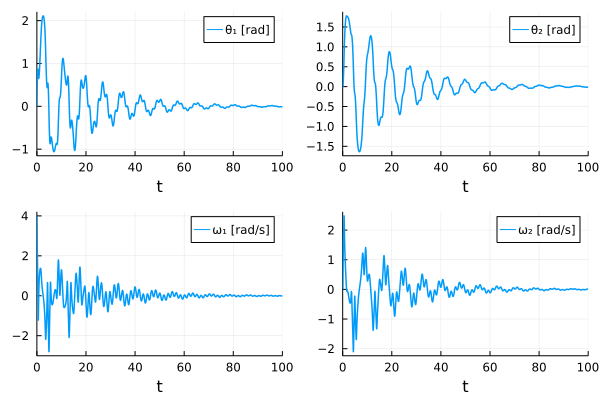

In [22]:
function double_pendulum_wf!(du, u, params, t)
    m₁, m₂, g, L₁, L₂, μ₁, μ₂ = params 
    θ₁, θ₂, ω₁, ω₂ = u
    du[1] = ω₁  # du[3]
    du[2] = ω₂  # du[4]
    du[3], du[4] = dpwf(u..., params...)
end

prob_double_wf = ODEProblem(double_pendulum_wf!, u₀_double, tspan, params_double_wf)
sol_double_wf = solve(prob_double_wf, reltol=1e-5, saveat=10e-3)

plot(sol_double_wf, linewidth=1.5, layout=(2,2), label=["θ₁ [rad]" "θ₂ [rad]" "ω₁ [rad/s]" "ω₂ [rad/s]"], xaxis="t")

In [23]:
@userplot doublependulumanim
@recipe function ffdpend!(oa::doublependulumanim)
    x, y, m, title_time = oa.args
    title --> "Double pendulum plot :: [$(@sprintf("%2.1f", title_time))%]"
    xaxis --> ("x", (-L₁-L₂-3*m, L₁+L₂+3*m))
    yaxis --> ("y", (-L₁-L₂-3*m, L₁+L₂+3*m))
    markersize --> 3 * m
    markercolor --> "black"
    seriestype --> :scatter
    legend --> :none
    framestyle --> :grid
    aspect_ratio --> 1
    dpi --> 150
    [x], [y]
end

function double_pendulum_animation(solution, filename)

    θ₁, θ₂ = @. (vec_to_list(solution.u, 1), vec_to_list(solution.u, 2))

    # time frame
    t = 0:0.02:100
    k = 4
    n = length(t) / k |> floor |> Int

    # animation
    anim = @animate for i in 1:n
        x_first, y_first = x(L₁, θ₁[k*i]), y(L₁, θ₁[k*i])
        x_second, y_second = x(L₂, θ₂[k*i]), y(L₂, θ₂[k*i])
        plot([0, x_first], [0, y_first])
        plot!([x_first, x_first + x_second], [y_first, y_first + y_second])
        doublependulumanim!(x_first, y_first, m₁, i/n * 100)
        doublependulumanim!(x_first + x_second, y_first + y_second, m₂, i/n * 100)
    end

    gif(anim, "animations/$filename.gif", fps=50)

end

double_pendulum_animation (generic function with 1 method)

┌ Info: Saved animation to 
│   fn = c:\Users\vital\git_projects\double-pendulum\animations\double_pendulum_no_friction.gif
└ @ Plots C:\Users\vital\.julia\packages\Plots\9C6z9\src\animation.jl:114


Plots.AnimatedGif("c:\\Users\\vital\\git_projects\\double-pendulum\\animations\\double_pendulum_no_friction.gif")
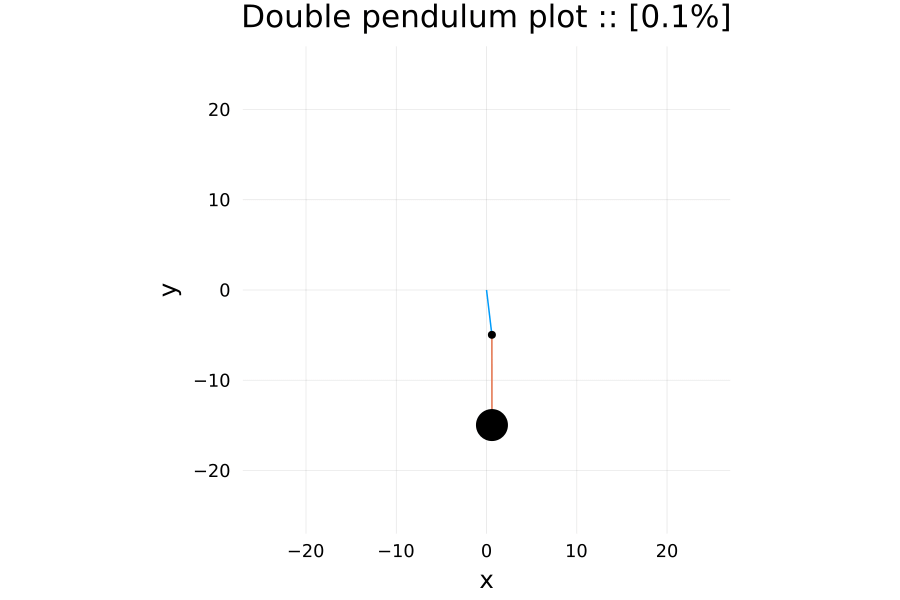

In [24]:
double_pendulum_animation(sol_double, "double_pendulum_no_friction")

┌ Info: Saved animation to 
│   fn = c:\Users\vital\git_projects\double-pendulum\animations\double_pendulum_with_friction.gif
└ @ Plots C:\Users\vital\.julia\packages\Plots\9C6z9\src\animation.jl:114


Plots.AnimatedGif("c:\\Users\\vital\\git_projects\\double-pendulum\\animations\\double_pendulum_with_friction.gif")
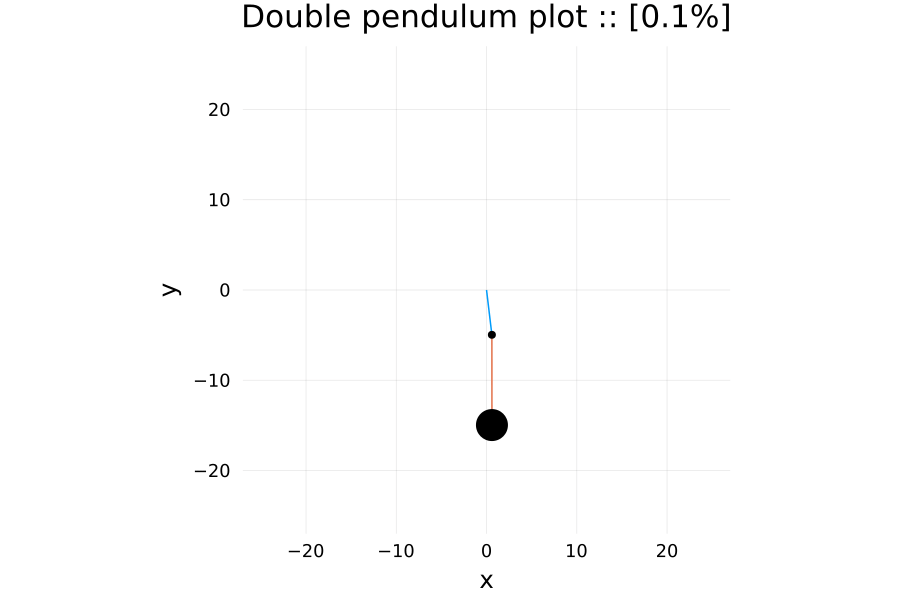

In [25]:
double_pendulum_animation(sol_double_wf, "double_pendulum_with_friction")